**Оглавление:**
1. [Открытие данных](#first)
2. [Предобработка данных](#sec)
    * [Обработка дубликатов](#dupl)
    * [Обработка пропущенных значений](#na)
3. [Анализ данных](#anls)
    * [Исследование категорий заведений](#cat)
    * [Исследование посадочных мест](#seat)
    * [Исследование сетевых и несетевых заведений](#chain)
    * [Исследование популярных сетей заведений](#pop)
    * [Исследование районов Москвы](#dis)
    * [Исследование средних рейтингов по категориям заведений](#rt)
    * [Фоновая картограмма среднего рейтинга заведений каждого района](#rt_map)
    * [Карта со всеми заведениями в Москве](#total)
    * [Исследование топ-15 улиц по количеству заведений](#pop_str)
    * [Исследование улиц с одним заведением](#single)
    * [Исследование средних чеков по районам](#bill)
    * [Общий вывод](#concl)
4. [Открытие кофеен](#op)
    * [Исследование кофеен](#rs)
    * [Круглосуточные кофейни](#24/7)
    * [Средний рейтинг кофеен по районам](#cof_rt)
    * [Цена за чашку кофе](#cof_pr)
    * [Рекомендация](#rec)
5. [Презентация](#pr)

## Открытие данных и изучение информации
<a id="first"></a>

In [1]:
#Загрузка необходимых библиотек
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import numpy as np

In [2]:
places = pd.read_csv('/datasets/moscow_places.csv') #Чтение датасета и сохранение в переменной
places.head() #Вывод первых 5 строк датасета

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
places.info() #Основная информация о столбцах датасета

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
places.describe() #Инофрмация о данных, содержащихся в датасете

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


**Вывод:** В данном датасете представлена информация о 8406 заведениях. Столбцы датасета содержат данные о названии заведения, режиме работы, его категории, местонахождении, рейтинге, категории цен, средний чек заказа и среднюю стоимость чашки кофе, а также о количестве место и является ли заведение частью сети. Большая часть столбцов хранят значения типа object или float64, в случае числовых значений, поскольку в подобных столбцах много пропущенных значений. Столбец с количеством мест хранит значения типа int64. Также, заметны аномалии в некоторых столбцах, к примеру слишком большое количество мест в заведении или слишком высокая цена за чашку кофе. 

## Предобработка данных
<a id="sec"></a>

### Поиск дубликатов
<a id='dupl'></a>

In [5]:
places.duplicated().sum() #Поиск дубликатов в датасете

0

In [6]:
a = places.groupby(by='name', as_index=False)['hours'].count().sort_values(by='hours', ascending=False)
for i in a['name']:
    print(i)

Шоколадница
Кафе
Домино'с Пицца
Додо Пицца
One Price Coffee
Яндекс Лавка
Cofix
Prime
КОФЕПОРТ
Хинкальная
Кулинарная лавка братьев Караваевых
Теремок
Шаурма
CofeFest
Буханка
Чайхана
Му-Му
Столовая
Drive Café
Кофемания
АндерСон
Крошка Картошка
Cinnabon
French Bakery
Скалка
Штолле
Тануки
VASILCHUKÍ Chaihona №1
Хлеб Насущный
Арамье
Osteria Mario
СушиСтор
Моремания
Бургер Кинг
Вареничная № 1
Pizza Express 24
МСК Lounge
Brasserie Lambic
Алло! Пицца
Бистро
Pizza Hut
Правда кофе
Джонджоли
Кофейня
Wild Bean Cafe
Халяль
Донер Кебаб
Bổ
PhoBo
Krispy Kreme
Волконский
Самарканд
Стейк & Бургер
Кафе-столовая
Kuzina
Пекарня
Coffeekaldi's
Франклинс Бургер
Академия
ДаблБи
Брусника
Грабли
Udcкафе
Батони
Хачапури
Ресторан
Кафетерий
IL Патио
9 Bar Coffee
Трапезная
Сити Пицца
Чайхона
Папа Джонс
Гамбринус
Буфет
Донер кебаб
Чайхона Айва
Take and Wake
Грузинская кухня
ВьетКафе
Мимино
Star Hit Cafe
Kitchen
Пицца Паоло
Шашлычная
Пан Запекан
Wild Bean
Кулинариум
Эль кафе
Кофе с собой
Zамания
Gagawa
Кондитерская-ку

In [7]:
places['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [8]:
places['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [9]:
places['price'].value_counts()

средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64

In [10]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Белла' in i:
        places.loc[places['name'] == i, 'name'] = 'Белла ЧАО'

In [11]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'White Fox' in i:
         places.loc[places['name'] == i, 'name'] = 'White Fox Cafe'

In [12]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Кафетериус' in i:
        places.loc[places['name'] == i, 'name'] = 'Кафетериус'

In [13]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'булок' in i or 'Булок' in i:
        places.loc[places['name'] == i, 'name'] = 'Между Булок'

In [14]:
 for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Ливан' in i:
        places.loc[places['name'] == i, 'name'] = 'Ливан Хаус'

In [15]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Лепим и Варим' in i:
        places.loc[places['name'] == i, 'name'] = 'Лепим и Варим'

In [16]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Хлеб Насущный' in i:
        places.loc[places['name'] == i, 'name'] = 'Хлеб Насущный'

In [17]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Хинкали' in i and 'Gали' in i:
        places.loc[places['name'] == i, 'name'] = 'Хинкали-Gали!'

In [18]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Бишкек' in i:
        places.loc[places['name'] == i, 'name'] = 'Чайхана Бишкек Сити'

In [19]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Ош' in i or 'ОШ' in i and 'Чай' in i:
        places.loc[places['name'] == i, 'name'] = 'Чайхана ОШ Сити'
    elif 'ОШ' in i and 'сити' in i and not 'Пош' in i:
        places.loc[places['name'] == i, 'name'] = 'Чайхана ОШ Сити'

In [20]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Зилола' in i:
        places.loc[places['name'] == i, 'name'] = 'Чайхана Зилола'

In [21]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Практика' in i:
        places.loc[places['name'] == i, 'name'] = 'Практика Кофе'

In [22]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Токио' in i:
        places.loc[places['name'] == i, 'name'] = 'Токио Рамен'

In [23]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Меркато' in i:
        places.loc[places['name'] == i, 'name'] = 'Меркато'

In [24]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Mátes ' in i:
        places.loc[places['name'] == i, 'name'] = 'Mátes'

In [25]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'paya' in i and 'Hello' in i:
        places.loc[places['name'] == i, 'name'] = 'HelloPapaya'

In [26]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Ku:' in i:
        places.loc[places['name'] == i, 'name'] = 'Ku: Рамен Изакая бар'

In [27]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Shake' in i:
        places.loc[places['name'] == i, 'name'] = 'ShakeUp'

In [28]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Bloom-n-' in i:
        places.loc[places['name'] == i, 'name'] = 'Bloom-n-Brew'

In [29]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Cantina' in i:
        places.loc[places['name'] == i, 'name'] = 'Cantina City'

In [30]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Carrots' in i:
        places.loc[places['name'] == i, 'name'] = 'Carrots and Beans'

In [31]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Angel Cakes' in i:
        places.loc[places['name'] == i, 'name'] = 'Angel Cakes City'

In [32]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Bb' in i:
         places.loc[places['name'] == i, 'name'] = 'Bb Grill'

In [33]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Festa' in i: 
        places.loc[places['name'] == i, 'name'] = 'Festa & Тесто'

In [34]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Домино' in i:
        places.loc[places['name'] == i, 'name'] = "Домино'с Пицца"

In [35]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Едаки' in i:
        places.loc[places['name'] == i, 'name'] = "Едаки"

In [36]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Здоровое' in i:
        places.loc[places['name'] == i, 'name'] = "Здоровое Питание"

In [37]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Вкус' in i and 'кафе' in i:
        places.loc[places['name'] == i, 'name'] = "ВкусВилл, кафе"

In [38]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Yumbaker' in i:
        places.loc[places['name'] == i, 'name'] = "Yumbaker"

In [39]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if ('Box' in i or 'box' in i) and 'Wok' in i:
        places.loc[places['name'] == i, 'name'] = "Wok & Box"

In [40]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Wasabi' in i:
        places.loc[places['name'] == i, 'name'] = "Wasabi"

In [41]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Азия ' in i and not 'Чай' in i:
        places.loc[places['name'] == i, 'name'] = "Азия Микс"

In [42]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Авла' in i:
        places.loc[places['name'] == i, 'name'] = "АвлаБар"

In [43]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Surf Coffee' in i:
        places.loc[places['name'] == i, 'name'] = "Surf Coffee"

In [44]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'True Cost' in i:
        places.loc[places['name'] == i, 'name'] = "True Cost"

In [45]:
for i in places['name']: #Замена неявных дубликатов на общее название
    if 'Буфетрина' in i:
        places.loc[places['name'] == i, 'name'] = "Буфетрина"

In [46]:
places['name'] = places['name'].str.lower()
places['address'] = places['address'].str.lower()
places[places[['name','address']].duplicated() == True]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
2467,хлеб насущный,булочная,"москва, комсомольская площадь, 3",Центральный административный округ,пн-пт 07:00–21:00; сб 07:00–20:00; вс 08:00–20:00,55.779720,37.654411,4.1,NaN,NaN,NaN,NaN,0,200.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [47]:
places = places.drop_duplicates(subset=['name', 'address'])
places[['name', 'address']].duplicated().sum()

0

### Работа с пропущенным значениями
<a id='na'></a>

In [48]:
places.isna().sum() #Поиск пропущенных значений

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5086
avg_bill             4585
middle_avg_bill      5252
middle_coffee_cup    7866
chain                   0
seats                3610
dtype: int64

In [49]:
#Сохранение в переменной индексов строк, в которых пропущены все основные значения, нужные для исследования
p = places[
    (places['hours'].isna() == True) &
    (places['seats'].isna() == True) & 
    (places['avg_bill'].isna() == True)]
pi = p.index 

In [50]:
places = places.drop(index=pi, axis=0) #Удаление найденных строк по индексам

In [51]:
#Замена пропущенных значений в столбцах с данными типа object на заглушку
places[['price', 'avg_bill', 'hours']] = places[['price', 'avg_bill', 'hours']].fillna('Нет информации')

In [52]:
d = places['address'].str.split(',', expand=True, n = 3) #Деление строк в столбце с адресом заведение на 3 элемента
places['street'] = d[1] #сохранение улицы без номера дома и указания города в новом столбце
places.head() #Вывод первых 5 строк

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,Нет информации,Нет информации,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,Нет информации,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


In [53]:
places[places['hours'] == 'ежедневно, круглосуточно']['hours'].count() #Общее число круглосуточных заведений

730

In [54]:
#Цикл по обозначению логическими значениями круглосуточных и некруглосуточных заведений в новом столбце 
for i in places['hours']:
    if 'ежедневно' in i and 'круглосуточно' in i:
        places.loc[places['hours'] == i, 'is_24/7'] = True
    else:
        places.loc[places['hours'] == i, 'is_24/7'] = False

In [55]:
places.head() #Вывод первых 5 строк

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,Нет информации,Нет информации,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,Нет информации,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


**Вывод:** В ходе предобработки данных были обработаны пропущенные значения, также датасет был проверен на дубликаты и неявные дубликаты. Были созданы два новых столбца - столбец с улицей, на которой находится заведение и столбец с пометкой является ли заведение круглосуточным. 

## Анализ данных
<a id="anls"></a>

### Исследование категорий заведений
<a id="cat"></a>

In [56]:
cat = places.groupby(by='category', as_index=False)['name'].count() #Группировка данных по категориям и подсчет кол-ва заведений
cat = cat.rename(columns={'name': 'total_num'}) #Переименование столбца для удобства работы
cat

,category,total_num
0,"бар,паб",758
1,булочная,250
2,быстрое питание,595
3,кафе,2193
4,кофейня,1404
5,пиццерия,632
6,ресторан,2022
7,столовая,312


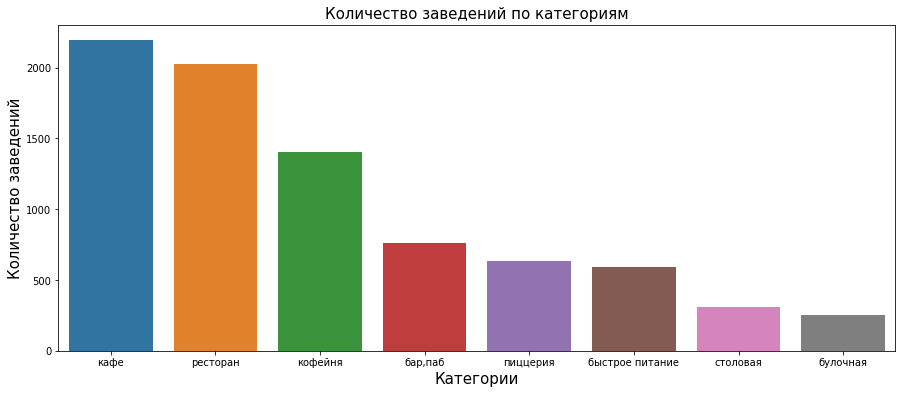

In [57]:
plt.figure(figsize=(15,6)) #Настройка размера графика
sns.barplot(data=cat.sort_values(by='total_num', ascending=False), x='category', y='total_num') #Создание графика распределения
plt.xlabel('Категории', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
plt.title('Количество заведений по категориям', fontsize=15)
plt.show()

Как видно на графике, большинство заведений относится к категории "кафе". Возможной причиной является тот факт, что в отличие от ресторанов, кафе ориентированы на широкие массы людей с разным уровнем достатка. Рестораны, в свою очередь, находятся на втором месте, а кофейни на третьем. Такое положение кофеен возможно объяснить тем, что у кофеен высокая конкуренция и они редко могут предоставлять такой ассортимент товаров, который бы выделил конкретное заведение среди других.

### Исследование посадочных мест
<a id="seat"></a>

In [58]:
seat_gr = places.groupby(by='category', as_index=False)['seats'].sum() #Группировка кол-ва мест в заведении по категориям
seat_gr_md = places.groupby(by='category', as_index=False)['seats'].median() #Подсчет медианного кол-ва мест по категориям
seat_gr['seats_md'] = seat_gr_md['seats'] #Добавление нового столбца с меданными значениям
seat_gr = seat_gr.rename(columns={'seats':'seats_total'}) #Переименование столбца
seat_gr

,category,seats_total,seats_md
0,"бар,паб",58131.0,82.0
1,булочная,13029.0,50.0
2,быстрое питание,34513.0,65.0
3,кафе,118494.0,60.0
4,кофейня,83511.0,80.0
5,пиццерия,40350.0,55.0
6,ресторан,154681.0,86.0
7,столовая,16359.0,75.5


In [59]:
fig = px.bar(seat_gr.sort_values(by='seats_total', ascending=True), 
             x='seats_total', 
             y='category',
            text='seats_total') #Создание диаграммы на основе ранее сгруппированных данных
fig.update_layout(title='Общее количество мест в заведениях по категориям',
                 xaxis_title='Количество мест',
                 yaxis_title='Категории заведений') #Добавление подписей к диаграмме
fig.show()

По общему количеству мест лидируют три категории - ресторан, кафе и кофейня. Зачастую в ресторанах есть достаточно много мест, которые могут быть использованы для проведения каких-либо мероприятий. 

In [60]:
fig = px.bar(seat_gr.sort_values(by='seats_md', ascending=True), 
             x='seats_md', 
             y='category',
            text='seats_md') #Создание диаграммы с медианным количеством мест 
fig.update_layout(title='Медианное количество мест в заведениях по категориям',
                 xaxis_title='Медианное количество мест',
                 yaxis_title='Категории')
fig.show()

Медианное количество мест в ресторанах равно 86, в барах и пабах - примерно 82 и в кофейнях 80. В ресторанах такое количество может быть объяснено тем, что в них предполагается проведение каких-либо банкетов. Немного необычно выглядит то, что медианное количество мест в кафе (60) меньше, чем в барах и кофейнях. Возможно на это повлияло то, что в датасете много небольших заведений, которые относятся кафе, где мало мест для посетителей.

### Исследование сетевых и несетевых заведений
<a id="chain"></a>

In [61]:
ch_ratio = places.groupby(by='chain', as_index=False)['name'].count() #Группировка данных по сетевым и несетевым заведениям
pl_num = places['name'].count() #Подсчет общего числа заведений в датасете
ch_ratio['percent'] = round(ch_ratio['name']/pl_num *100) #Округление процентного выражения
ch_ratio.loc[ch_ratio['chain'] == 0, 'chain'] = 'Нет' #Замена значений на более удобные для представления на диаграмме
ch_ratio.loc[ch_ratio['chain'] == 1, 'chain'] = 'Да'
ch_ratio

,chain,name,percent
0,Нет,5009,61.0
1,Да,3157,39.0


In [62]:
fig = go.Figure(data=[go.Pie(labels=ch_ratio['chain'],
                            values=ch_ratio['percent'])]) #Создание круговой диаграммы
fig.update_layout(title='Соотношение сетевых и несетевых заведений',
                  width=800,
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Сеть заведений',
                                   showarrow=False)]) #Настройка диаграммы и аннотации к ней
fig.update_traces(hoverinfo='label+value')
fig.show()

Диаграмма показывает, что 61% заведений не относится к какой-либо сети.

In [63]:
ch_cat = places.groupby(['category', 'chain'], as_index=False)['name'].count() #Группировка заведений по категориям и сетям
ch_cat = ch_cat.rename(columns={'name':'total_num'}) #Переименование столбца для удобства
ch_cat.loc[ch_cat['chain'] == 0, 'chain'] = 'Нет' 
ch_cat.loc[ch_cat['chain'] == 1, 'chain'] = 'Да'
ch_cat
fig = px.bar(ch_cat.sort_values(by='total_num', ascending=False), 
            y='total_num',
            x='category',
            color='chain', #Разделение данных по сетевым и несетевым заведениям
             hover_data={'category':False}, #Убираем показ с данными о категориях
            labels={'chain':'Сеть заведений', 'total_num':'Общее количество заведений'}) #Переименование элементов для удобства

fig.update_layout(title='Соотношение сетевых и несетевых заведений по категориям',
                 xaxis_title='Категории',
                 yaxis_title='Количество заведений') #Подписи к диаграммам
fig.update_xaxes(categoryorder='total descending')
fig.show()

Большинство ресторанов и кафе, баров, заведений быстрого питания и столовых не являются частью сети. В то же время кофейни, пиццерии и булочные по большей части относятся к какой-либо сети заведений.

### Исследование популярных сетей заведений
<a id="pop"></a>

In [64]:
pop = (places.query('chain == 1') #Группировка сетевых заведений по названию и категории
       .groupby(by=['name', 'category'])
       .agg({'hours':'count', 'rating':'median'}) #Подсчет заведений и подсчет медианного рейтинга
       .sort_values(by='hours', ascending=False) #Сортировка по убыванию кол-ва заведений
       .head(15) #Сохранение в переменной первых 15 строк
      )
pop = pop.rename(columns={'hours':'total_num'}) #Переименование столбца
pop = pop.reset_index() #Сброс старых индексов и создание новых
pop

,name,category,total_num,rating
0,шоколадница,кофейня,119,4.2
1,домино'с пицца,пиццерия,76,4.2
2,додо пицца,пиццерия,74,4.3
3,one price coffee,кофейня,71,4.2
4,яндекс лавка,ресторан,69,4.0
5,cofix,кофейня,65,4.1
6,prime,ресторан,49,4.2
7,кофепорт,кофейня,42,4.2
8,кулинарная лавка братьев караваевых,кафе,39,4.4
9,теремок,ресторан,36,4.1


In [65]:
fig = px.bar(pop.sort_values(by='total_num', ascending=True), 
             x='total_num', 
             y='name',
            text='total_num', #Создание диаграммы
            hover_data={'name':False}) #Убираем показ названий заведений при наведении
fig.update_layout(title='Топ 15 самых популярных сетей в Москве',
                 xaxis_title='Количество открытых точек сети',
                 yaxis_title='Названия сети')
fig.show()

Самой распространённой сетью является сеть кафе "Шоколадница". За ней идут пиццерии Домино'с и Додо, кофейня One Price Coffee, Яндекс Лавка и Cofix. Другие сети имеют заметно меньше заведений. В основном в топ входят кофейни, кафе и рестораны, но также присутствую две пиццерии и одна булочная.

### Исследование районов Москвы
<a id="dis"></a>

In [66]:
dis1 = places.groupby(by='district', as_index=False)['name'].count() #Группировка данных пока районам города
dis1

,district,name
0,Восточный административный округ,766
1,Западный административный округ,829
2,Северный административный округ,878
3,Северо-Восточный административный округ,862
4,Северо-Западный административный округ,387
5,Центральный административный округ,2229
6,Юго-Восточный административный округ,663
7,Юго-Западный административный округ,684
8,Южный административный округ,868


In [67]:
dis1['dis_ratio'] = round(dis1['name']/pl_num *100, 1) #Подсчет процентного соотношения колисества заведений по районам
dis1

,district,name,dis_ratio
0,Восточный административный округ,766,9.4
1,Западный административный округ,829,10.2
2,Северный административный округ,878,10.8
3,Северо-Восточный административный округ,862,10.6
4,Северо-Западный административный округ,387,4.7
5,Центральный административный округ,2229,27.3
6,Юго-Восточный административный округ,663,8.1
7,Юго-Западный административный округ,684,8.4
8,Южный административный округ,868,10.6


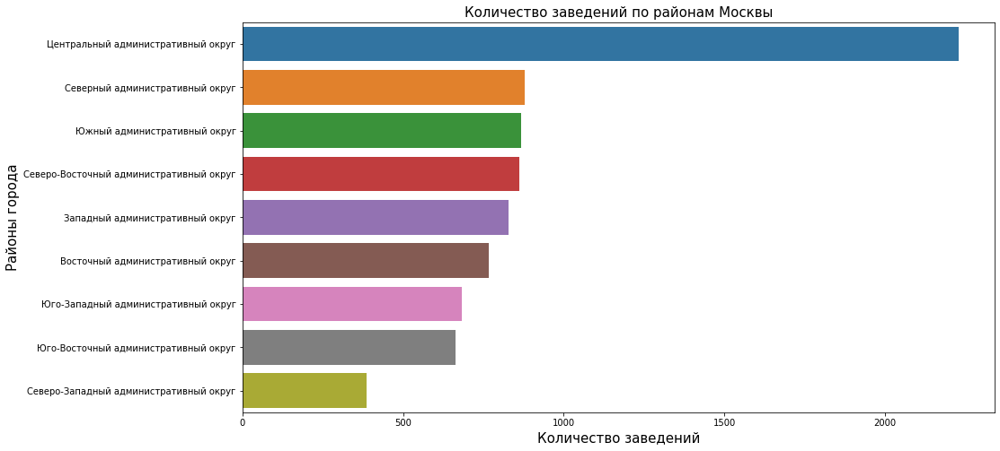

In [68]:
plt.figure(figsize=(15,8)) #Настройка размера графика
sns.barplot(data=dis1.sort_values(by='name', ascending=False), x='name', y='district') #Создание графика распределения
plt.xlabel('Количество заведений', fontsize=15)
plt.ylabel('Районы города', fontsize=15)
plt.title('Количество заведений по районам Москвы', fontsize=15)
plt.show()

Подавляющее большинство заведений расположени в Центральном административном округе. Это логично, поскольку именно в Центральном районе собирается большое количество людей. По остальным районам, кроме Северо-Западного, заведения распределились примерно одинаково. В Северо-Западном меньше всего заведений, возможно потому, что там не так много удобных локаций для открытия заведения.

In [69]:
dis2 = places.groupby(by=['district','category'], as_index=False)['name'].count()
dis3 = dis2.merge(dis1, how='left', on='district')
dis3 = dis3.rename(columns={'name_x':'num_per_cat', 'name_y':'total_num_per_dis'})
dis3['num_ratio'] = round(dis3['num_per_cat']/pl_num*100,2)
dis3.head(16)

,district,category,num_per_cat,total_num_per_dis,dis_ratio,num_ratio
0,Восточный административный округ,"бар,паб",52,766,9.4,0.64
1,Восточный административный округ,булочная,24,766,9.4,0.29
2,Восточный административный округ,быстрое питание,70,766,9.4,0.86
3,Восточный административный округ,кафе,246,766,9.4,3.01
4,Восточный административный округ,кофейня,103,766,9.4,1.26
5,Восточный административный округ,пиццерия,72,766,9.4,0.88
6,Восточный административный округ,ресторан,159,766,9.4,1.95
7,Восточный административный округ,столовая,40,766,9.4,0.49
8,Западный административный округ,"бар,паб",50,829,10.2,0.61
9,Западный административный округ,булочная,37,829,10.2,0.45


In [70]:
fig=px.bar(dis3,
          x='district',
          y='num_per_cat',
          color='category',
          text='num_per_cat',
          width=1000,
          height=800,
          hover_data={'district':False, 'num_ratio':True},#Убираем пометку о районе из виджета и добавляем пометку о соотношении
          labels={'category':'Категории заведений', 
                  'num_per_cat':'Количество заведений по категории', 
                  'num_ratio':'Процент от общего числа заведений'}) #Переименование столбцов для удобного отображения
fig.update_layout(title='Общее количество заведений и количество заведений каждой категории по районам Москвы',
                 xaxis_title='Район города',
                 yaxis_title='Количество заведений')
fig.update_xaxes(categoryorder='total descending')
fig.show()

Большая часть заведений находится в Центральном районе. Меньше всего в Северо-Западном районе. В остальных районе количество заведений примерно одинаковое. 

### Исследование средних рейтингов по категориям заведений
<a id="rt"></a>

In [71]:
rt = places.groupby(by='category', as_index=False)['rating'].mean() #Группировка по категориям и подсчет среднего рейтинга
rt['rating'] = round(rt['rating'], 1) #округление среднего значения
fig = px.bar(rt.sort_values(by='rating',ascending=False), 
            y='rating',
            x='category',
            text='rating')
            
             
            
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                 xaxis_title='Категории',
                 yaxis_title='Средний рейтинг заведений')
fig.show()

Самый высокий средний рейтинг у заведений категории "бар и паб". Самый низкий рейтинг у заведений быстрого питания и кафе.

### Фоновая картограмма среднего рейтинга заведений каждого района
<a id="rt_map"></a>

In [72]:
dis_rt = places.groupby('district', as_index=False)['rating'].mean().round(1) #Группирвока по районам и подсчет среднего рейтинга
dis_rt

,district,rating
0,Восточный административный округ,4.2
1,Западный административный округ,4.2
2,Северный административный округ,4.2
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.2
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.1
7,Юго-Западный административный округ,4.2
8,Южный административный округ,4.2


In [73]:
from folium import Map, Choropleth, Marker #Загрузка библиотек для работы с картами
from folium.plugins import MarkerCluster
state_geo = '/datasets/admin_level_geomap.geojson' #сохранение файла с районами
moscow_lat, moscow_lng = 55.751244, 37.618423 #Координаты центра Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10) #Создание карты Москвы
Choropleth(
    geo_data=state_geo,
    data=dis_rt,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m) #Создание хороплета и добавление на карту
m

### Карта со всеми заведениями в Москве
<a id="total"></a>

In [74]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m) #Создание пустого кластера
def create_clusters(row): 
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster) #Написание функции по добавлению маркеров в кластер
places.apply(create_clusters, axis=1) #Применение функции
m

### Исследование топ-15 улиц по количеству заведений
<a id="pop_str"></a>

In [75]:
pop_st =  places.groupby(by='street', as_index=False)['name'].count().sort_values(by='name', ascending=False).head(15)
pop_st

,street,name
824,проспект мира,177
828,профсоюзная улица,120
821,проспект вернадского,107
523,ленинский проспект,106
521,ленинградский проспект,93
370,дмитровское шоссе,88
452,каширское шоссе,76
298,варшавское шоссе,74
522,ленинградское шоссе,69
544,люблинская улица,60


In [76]:
#Группировка по улицам, подсчет заведений и сортировка по убыванию
pop_st_gr = places.groupby(
    by=['street','category'], as_index=False)['name'].count().sort_values(by='name', ascending=False).head(15)  #Вывод 15 строк
l = []
for i in pop_st['street']:
    l.append(i)
d=pd.DataFrame()
for i in places['street'].unique():
    if i in l:
        d = d.append(places[places['street'] == i], ignore_index=True)
gd = d.groupby(by=['street', 'category'], as_index=False)['name'].count()
gd.head(15)

,street,category,name
0,варшавское шоссе,"бар,паб",6
1,варшавское шоссе,быстрое питание,7
2,варшавское шоссе,кафе,17
3,варшавское шоссе,кофейня,13
4,варшавское шоссе,пиццерия,4
5,варшавское шоссе,ресторан,20
6,варшавское шоссе,столовая,7
7,дмитровское шоссе,"бар,паб",6
8,дмитровское шоссе,булочная,2
9,дмитровское шоссе,быстрое питание,10


In [77]:
fig=px.bar(gd,
          x='street',
          y='name',
          color='category',
          text='name',
          width=1000,
          height=800,
          hover_data={'street':False},#Убираем пометку о районе из виджета
          labels={'category':'Категории заведений', 
                  'name':'Количество заведений по категории' 
                  }) #Переименование столбцов для удобного отображения
fig.update_layout(title='Количество заведений каждой категории на 15 улицах Москвы с самым большим числом заведений',
                 xaxis_title='Названия улиц',
                 yaxis_title='Количество заведений')
fig.update_xaxes(categoryorder='total descending')
fig.show()

График показывает, что очень много заведений расположено на проспекте Мира, где большинство составляются различные кафе и рестораны. Далее идут Профсоюзная улица, Ленинский проспект, проспект Вернадского и Ленинградский прсопект.

### Исследование улиц с одним заведением
<a id="single"></a>

In [78]:
pp = places.groupby(by='street', as_index=False)['name'].count() #Группирока в по улицам и подсчет заведений
n = pp.query('name == 1') #Срез по улицам с одним заведений
d = pd.DataFrame() #Создание пустого датасета
for i in n['street']:
   d = d.append(places.query('street == @i'), ignore_index=True) #Добавление строк из среза в пустой датасет
d.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,чайхана азия,кафе,"москва, 1-й автозаводский проезд, 5",Южный административный округ,"ежедневно, круглосуточно",55.704847,37.657065,4.2,средние,Средний счёт:190–350 ₽,270.0,NaN,1,20.0,1-й автозаводский проезд,True
1,хуан хэ,ресторан,"москва, 1-й балтийский переулок, 3/25",Северный административный округ,"ежедневно, 12:00–22:00",55.810418,37.518824,4.4,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,60.0,1-й балтийский переулок,False
2,колизей,кафе,"москва, 1-й варшавский проезд, 1ас9",Южный административный округ,пн-чт 10:00–00:00; пт-вс 10:00–05:00,55.648674,37.627979,4.0,Нет информации,Нет информации,NaN,NaN,0,NaN,1-й варшавский проезд,False
3,shelby,"бар,паб","москва, 1-й голутвинский переулок, 6",Центральный административный округ,пн-пт 09:00–20:00,55.739600,37.613494,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,0,22.0,1-й голутвинский переулок,False
4,домашняя кухня,"бар,паб","москва, 1-й грайвороновский проезд, 2а",Юго-Восточный административный округ,"ежедневно, 10:00–02:00",55.719354,37.727758,3.9,средние,Нет информации,NaN,NaN,0,NaN,1-й грайвороновский проезд,False


In [79]:
dg = d.groupby(by='category', as_index=False)['name'].count()
dg

,category,name
0,"бар,паб",40
1,булочная,9
2,быстрое питание,26
3,кафе,150
4,кофейня,90
5,пиццерия,14
6,ресторан,93
7,столовая,37


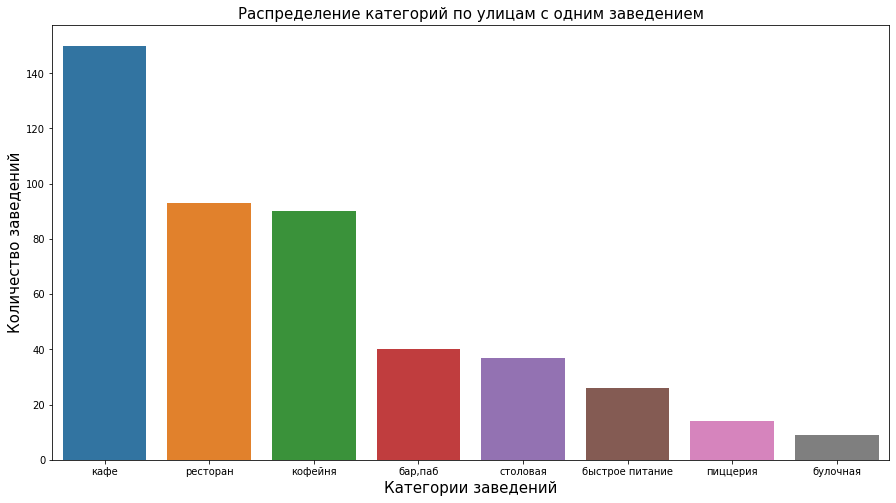

In [80]:
plt.figure(figsize=(15,8)) #Настройка размера графика
sns.barplot(data=dg.sort_values(by='name', ascending=False), x='category', y='name') #Создание графика распределения
plt.xlabel('Категории заведений', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
plt.title('Распределение категорий по улицам с одним заведением', fontsize=15)
plt.show()

Более 140 заведений относится к категории кафе, ресторанов и кофеен примерно равное количество. Булочных меньше всего на улицах с одним заведением. Можно предположить, что из-за специфического расположений улиц, ресторанам и кофейням не так выгодно открываться на них.

In [81]:
#Создание карты с кластерами заведений, единсвтенными на своей улице
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def marker(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']} {row['street']}").add_to(marker_cluster)
d.apply(marker, axis=1)
m

### Исследование средних чеков по районам
<a id="bill"></a>

In [82]:
#Группировка по районам и подсчет медианного значения чека
avg_bill_dis = places.groupby(by='district', as_index=False)['middle_avg_bill'].median()
avg_bill_dis

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [83]:
#Создание хороплета с медианными значенями чека по районам
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=avg_bill_dis,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Медианный чек в заведениях по районам',
).add_to(m)
m

Самые высокие значения медианного чека наблюдаются в Центральном и Западном районах.

In [84]:
import folium
from folium.plugins.heat_map import HeatMap
m = folium.Map([55.751244, 37.618423], zoom_start=10)
heatmap_data = places[['lat','lng', 'rating']].copy().dropna()
heatmap = heatmap_data[['lat','lng', 'rating']] 
HeatMap(data=heatmap, radius=14).add_to(m)
m 

На тепловой карте видно, что чем дальше от центра города, тем заведений с большим средним чеком становится меньше, хотя они все равно продолжают встречаться.

### Общий вывод
<a id="concl"></a>

**Вывод:** В данном датасете представлены такие категории, как: бар, кофейня, кафе, ресторан, столовая, быстрое питание, пиццерия и булочная. Больше всего заведений относятся к кафе (2195).

Посадочных мест по медиане больше всего в ресторанах (86), далее идут бары и пабы (82) и кафе (80), поскольку в ресторанах и кафе часто имеются банкетные залы для каких-либо мероприятияй.

Среди заведений преобладают несетевые (61% от общего числа). Чаще всего к сетевым относятся рестораны, кафе и кофейни. К самым популярным сетевым заведениям относятся "Шоколадница" - 119, "Домино'с Пицца" - 76 и "Пицца додо" - 74. По большей части популярные сетевые заведения являются кафе или кофейней, но среди них есть так же пиццерии, рестораны и даже булочная.

В датасете представлены следующие районы: Восточный административный округ, Западный административный округ, Северный административный округ, Северо-Восточный административный округ, Северо-Западный административный округ, Центральный административный округ, Юго-Восточный административный округ, Юго-Западный административный округ и	Южный административный округ. Больше всего заведений находится в Центральном административном округе (2242 заведений). 

Рейтинг заведений по категориям разнится от 4.1 до 4.4. Самый высокий рейтинг у баров и пабов, а самый низкий у заведений быстрого питания и кафе. Самый высокий рейтинг средний рейтинг у заведений в Центральном районе. 

Среди улиц с самым большим количестом заведений: проспект Мира (178), Профсоюзная улица (120), Ленинский проспект (107). Улиц с одним заведением было найдено 458. Зачастую эти заведения находятся в не самых очевидных местах или там, где трафик посетитетелей не такой большой. Возможно, поэтому на этих улицах только одно заведение. 

Самый большой медианный чек наблюдается в Центральном и Западном районах. Далее идут Северный, Восточный, Северо-Западный и Юго-Западный. Самый маленький медианный чек в заведениях в Юго-Восточном, Северо-Восточном и Южном районах.

## Открытие кофейни
<a id='op'></a>

### Исследование кофеен
<a id="rs"></a>

In [85]:
cf = places.query('category == "кофейня"') #Срез датасета по кофейням и сохранение в переменной
cf_total = cf['name'].count()
cf_total

1404

In [86]:
cf_dis = cf.groupby('district', as_index=False)['name'].count() #Группировка по району и подсчет заведений
cf_dis['ratio'] = round(cf_dis['name']/cf_total*100,1)
cf_dis

,district,name,ratio
0,Восточный административный округ,103,7.3
1,Западный административный округ,150,10.7
2,Северный административный округ,192,13.7
3,Северо-Восточный административный округ,157,11.2
4,Северо-Западный административный округ,62,4.4
5,Центральный административный округ,427,30.4
6,Юго-Восточный административный округ,88,6.3
7,Юго-Западный административный округ,95,6.8
8,Южный административный округ,130,9.3


In [87]:
fig = px.bar(cf_dis.sort_values(by='name', ascending=True),
             y='district',
            x='name',
            text='name')
fig.update_layout(title='Диаграмма распределения кофеен по районам',
                 xaxis_title='Количество кофеен',
                 yaxis_title='Район города')
fig.show()

В Центральном районе работает 427 кофеен, это больше, чем в других районах. Меньше всего кофеен в Северо-Западном районе.

In [88]:
#Создание хороплета с распределением кофеен по районам города
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=cf_dis,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Распределение количества кофеен по районам',
).add_to(m)
m

На карте видно, что количество кофеен в Центральном районе самое большое. Далее идут Западный, Южный, Северный и Северо-Восточный округа.

In [89]:
#Создание карты с кластерами всех кофеен в городе
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def marker(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']} {row['street']}").add_to(marker_cluster)
cf.apply(marker, axis=1)
m

### Круглосуточные кофейни
<a id="24/7"></a>

In [90]:
cf[cf['is_24/7'] == True]['name'].count() #Подсчет круглосуточных кофеен

59

In [91]:
cf_dn = cf[cf['is_24/7'] == True]
bar = cf_dn.groupby(by='district', as_index=False)['name'].count()
fig = px.bar(bar.sort_values(by='name', ascending=True),
             y='district',
            x='name',
            text='name')
fig.update_layout(title='Диаграмма распределения круглосуточных кофеен по районам',
                 xaxis_title='Количество круглосуточных кофеен',
                 yaxis_title='Район города')
fig.show()

Можно заметить, что большая часть круглосуточных кофеен сосредоточена в Центральном административном районе. Меньше всего в Южном и Юго-Восточном административных округах.

In [92]:
#Создание карты с кластерами круглосуточных кофеен
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def marker(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']} {row['street']}").add_to(marker_cluster)
cf_dn.apply(marker, axis=1)
m

### Средний рейтинг кофеен по районам
<a id="cof_rt"></a>

In [93]:
cf_rt = cf.groupby('district', as_index=False)['rating'].mean().round(1) #Группировка по районам и подсчет среднего рейтинга
cf_rt

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.2
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.2


In [94]:
#Создание карты с отображением среднего рейтинга заведений по районам
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=cf_rt,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)
m

По карте видно, что в Западном, Южном, Юго-Восточном и Северо-Восточном районах средний рейтинг кофеен ниже, чем в других. 

In [95]:
from folium.plugins.heat_map import HeatMap
m = folium.Map([55.751244, 37.618423], zoom_start=10)
heatmap_data = places[['lat','lng', 'rating']].copy().dropna()
heatmap = heatmap_data[['lat','lng', 'rating']] 
HeatMap(data=heatmap, radius=14).add_to(m)
m 

Тепловая карта показывает распределение среднего рейтинга заведений по карте Москвы. Заметно, что в центре концетрируются заведения с высоким рейтингом. При удалении от центра средний рейтинг снижается, но остаются отдельные места, где есть заведения с высоким рейтингом.

### Цена за чашку кофе
<a id="cof_pr"></a>

In [96]:
cf['middle_coffee_cup'].mean().round() #Среднее по ценам за чашку кофе

175.0

In [97]:
cf_pr = cf.groupby('district', as_index=False)['middle_coffee_cup'].median() #Группировка по районам
                                                                            #и подсчет медианного значения цены за кофе
cf_pr

,district,middle_coffee_cup
0,Восточный административный округ,135.0
1,Западный административный округ,189.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
5,Центральный административный округ,190.0
6,Юго-Восточный административный округ,147.5
7,Юго-Западный административный округ,198.0
8,Южный административный округ,150.0


In [98]:
#Создание диаграммы медианной цены за кофе по районам
fig = px.bar(cf_pr.sort_values(by='middle_coffee_cup', ascending=False),
             x='district',
            y='middle_coffee_cup',
            text='middle_coffee_cup')
fig.update_layout(title='Диаграмма распределения медианной цена за кофе по районам',
                 xaxis_title='Район города',
                 yaxis_title='Медианная цена за кофе')
fig.show()

Самая высокая медианная цена за кофе у заведений в Юго-Западном, Центральнои и Западном районах. Самая низкая наблюдается в Восточном районе.

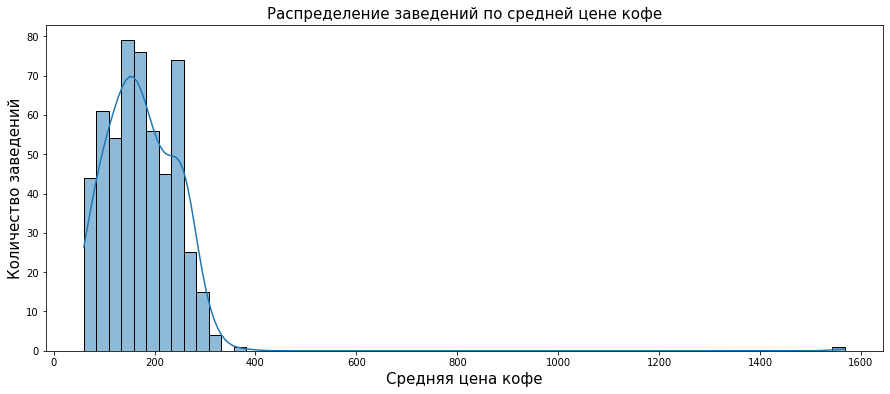

In [99]:
plt.figure(figsize=(15,6)) #Настройка размера графика
sns.histplot(places['middle_coffee_cup'], kde=True) #Создание графика распределения
plt.xlabel('Средняя цена кофе', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
plt.title('Распределение заведений по средней цене кофе', fontsize=15)
plt.show()

На графике отображено распределение заведений по средней цене за чашку кофе. Можно заметить, что в большинстве заведений цена цена указана от 170 до 190 рублей. Также наблюдается сильный выброс в виде аномально высокой цены за кофе.

In [100]:
fig = px.histogram(places, x="middle_coffee_cup",
                   marginal="box") #График распределения с диаграммой размаха
fig.update_layout(title='Распределение количества заведений по средней цене кофе',
                 xaxis_title='Средняя цена кофе',
                 yaxis_title='Количество заведений')
fig.show()

На этом графике так же видна аномалия, но медианное значение цены кофе отмечено диаграммой размаха и равно 169.

### Рекомендация
<a id="rec"></a>

**Рекомендация:**
Поскольку центр города является самым оживленным районом, большая часть кофеен расположена именно там (427 из 1404). Они расположены в людных местах, например в торговых центрах, рядом с парками, на больших оживленных проспектах или рядом с метро. Если не обращать внимание на большое количество других кофеен, логично было бы открыть кофейню в центральном районе, где большой трафик людей, высокий рейтинг заведений и не так много круглосуточных кофеен, хотя и больше, чем в других районах. К тому же в центральном районе можно ориентироваться на довольно высокую цена за чашку кофе, что так же повлияет на прибыльность. Несмотря на то, что медианная цена в Юго-Западном районе выше, там меньше удобных для кофейни мест. К примеру, можно разместить заведение вдоль Чистопрудного бульвара, где рядом сквер и станция метро. В кофейню могут заходить как отдыхащие и туристы, так и те, кто идет в метро или выходит из него, чтобы купить кофе с собой. Рядом есть только одна кофейня, которая работает круглосуточно и несколько обычных кофеен.

In [101]:
import folium
lat, lng = 55.763624, 37.642393
m = folium.Map(location=[lat, lng], zoom_start=17)
marker = folium.Marker([lat, lng])
marker.add_to(m)
m
#Одно из возможных мест расположения кофейни